# Framing the problem

**Business Objective:**
The primary goal is to predict movie ratings based on available data. This could help in making business decisions such as movie recommendations, targeted marketing, or content acquisition.


**Problem Framing:**
This is a supervised learning problem as we have labeled data (movie ratings). It's likely an offline task, as the model would be trained with existing data and used to make predictions without real-time updates.

**Performance Metrics:**
Common metrics for regression problems like this could be Mean Absolute Error (MAE), Root Mean Square Error (RMSE), or R-squared value.


# Data Acquisition

**Data Requirements:**
 For predicting movie ratings, the essential data includes movie features (genre, director, cast, year of release, etc.). The amount of data needed depends on the variety and depth of features; generally, more data leads to more accurate models.

**Data Sources:**
IMDB API ; online open data source (I found the IMDB dataset on kaggle.) ; data size - 692 KB , data type - sample

# Data Exploration

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Load the dataset
df = pd.read_csv('IMDB_rating.csv')

df.head()

,movie_title,movie_id,imdb_link,imdb_score,movie_budget,release_day,release_month,release_year,duration,language,...,western,sport,horror,drama,war,animation,crime,movie_meter_IMDBpro,cinematographer,production_company
0,August: Osage County,2,http://www.imdb.com/title/tt1322269/?ref_=fn_t...,7.3,25000000,10,Jan,2014,121,English,...,0,0,0,1,0,0,0,4000,Adriano Goldman,The Weinstein Company
1,Radio,12,http://www.imdb.com/title/tt0316465/?ref_=fn_t...,6.9,35000000,24,Oct,2003,109,English,...,0,1,0,1,0,0,0,8556,Don Burgess,Revolution Studios
2,Coach Carter,15,http://www.imdb.com/title/tt0393162/?ref_=fn_t...,7.2,30000000,14,Jan,2005,136,English,...,0,1,0,1,0,0,0,3940,Sharone Meir,Coach Carter
3,The Possession,20,http://www.imdb.com/title/tt0431021/?ref_=fn_t...,5.9,14000000,20,Aug,2012,92,English,...,0,0,1,0,0,0,0,5452,Dan Laustsen,Ghost House Pictures
4,Escape from Alcatraz,22,http://www.imdb.com/title/tt0079116/?ref_=fn_t...,7.6,8000000,22,Jun,1979,112,English,...,0,0,0,1,0,0,1,4722,Bruce Surtees,Paramount Pictures


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1930 entries, 0 to 1929
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   movie_title          1930 non-null   object 
 1   movie_id             1930 non-null   int64  
 2   imdb_link            1930 non-null   object 
 3   imdb_score           1930 non-null   float64
 4   movie_budget         1930 non-null   int64  
 5   release_day          1930 non-null   int64  
 6   release_month        1930 non-null   object 
 7   release_year         1930 non-null   int64  
 8   duration             1930 non-null   int64  
 9   language             1928 non-null   object 
 10  country              1930 non-null   object 
 11  maturity_rating      1930 non-null   object 
 12  aspect_ratio         1930 non-null   float64
 13  distributor          1930 non-null   object 
 14  nb_news_articles     1930 non-null   int64  
 15  director             1930 non-null   o

In [ ]:
df.describe()

,movie_id,imdb_score,movie_budget,release_day,release_year,duration,aspect_ratio,nb_news_articles,actor1_star_meter,actor2_star_meter,...,musical,romance,western,sport,horror,drama,war,animation,crime,movie_meter_IMDBpro
count,1930.000000,1930.000000,1.930000e+03,1930.000000,1930.000000,1930.000000,1930.000000,1930.000000,1.930000e+03,1.930000e+03,...,1930.000000,1930.000000,1930.000000,1930.000000,1930.000000,1930.000000,1930.000000,1930.000000,1930.000000,1930.000000
mean,7067.280311,6.511813,2.097377e+07,15.952332,2001.391710,109.698964,2.095995,770.609326,2.118956e+04,1.711409e+04,...,0.070466,0.245078,0.017617,0.048187,0.112953,0.549223,0.036269,0.010363,0.216062,11612.381347
std,5475.333572,1.100033,1.462811e+07,8.304084,11.775722,21.246121,0.273392,1860.424840,2.859934e+05,1.732816e+05,...,0.255998,0.430245,0.131587,0.214216,0.316618,0.497700,0.187008,0.101295,0.411664,40181.209726
min,2.000000,1.900000,5.600000e+05,1.000000,1936.000000,37.000000,1.180000,0.000000,9.000000e+00,3.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,71.000000
25%,2527.750000,5.900000,8.725000e+06,9.000000,1997.000000,96.000000,1.850000,78.000000,5.050000e+02,1.895250e+03,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2836.250000
50%,5801.500000,6.600000,1.800000e+07,17.000000,2004.000000,106.000000,2.350000,286.000000,1.888500e+03,3.986500e+03,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,5406.000000
75%,10603.500000,7.300000,3.000000e+07,23.000000,2010.000000,118.000000,2.350000,845.500000,4.665000e+03,7.667000e+03,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,10198.000000
max,21838.000000,9.300000,5.500000e+07,30.000000,2018.000000,330.000000,2.760000,60620.000000,8.342201e+06,5.529461e+06,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,849550.000000


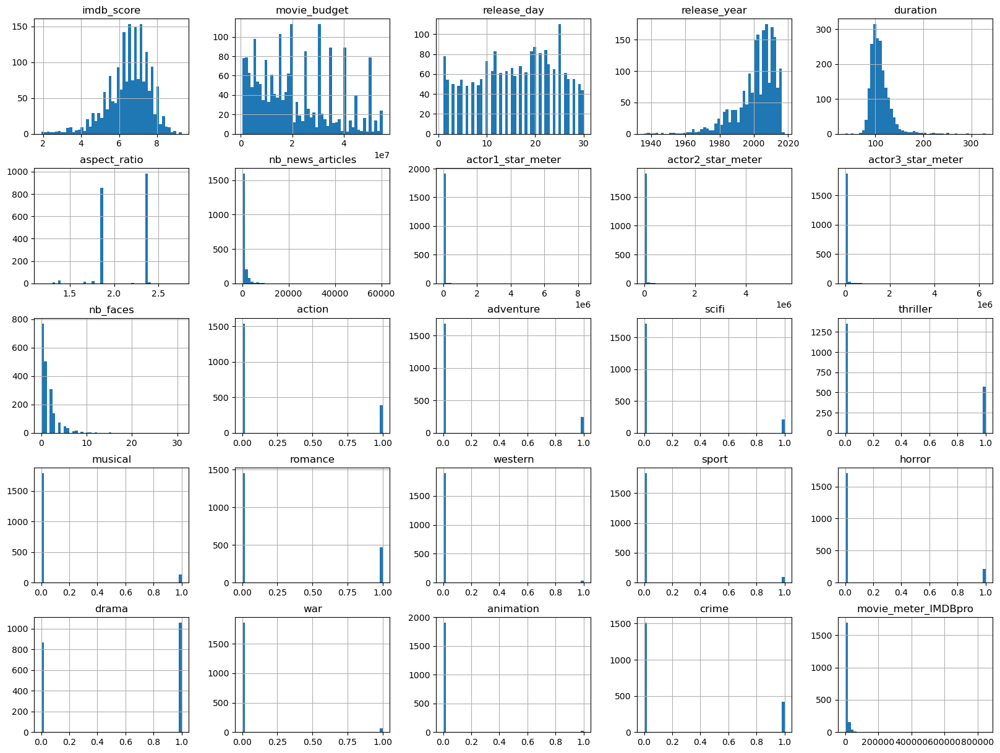

In [ ]:
numerical_col = df.select_dtypes(include=['int64', 'float64'])

del numerical_col['movie_id']

numerical_col.hist(bins=50, figsize=(20, 15))
plt.show()

Create a Test Set

In [8]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(df, test_size=0.2, random_state=42, stratify=df["maturity_rating"])

In [ ]:
movie = train_set.copy()

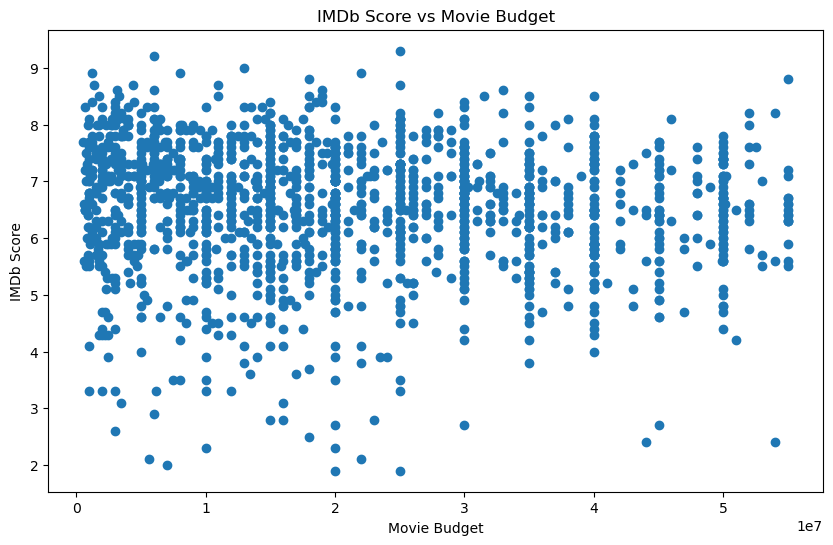

In [ ]:
# Selecting only numerical attributes for visualization
numerical_df = movie.select_dtypes(include=['int64', 'float64'])

# Scatter plot for imdb_score against movie_budget
plt.figure(figsize=(10, 6))
plt.scatter(numerical_df['movie_budget'], numerical_df['imdb_score'])
plt.title('IMDb Score vs Movie Budget')
plt.xlabel('Movie Budget')
plt.ylabel('IMDb Score')
plt.show()

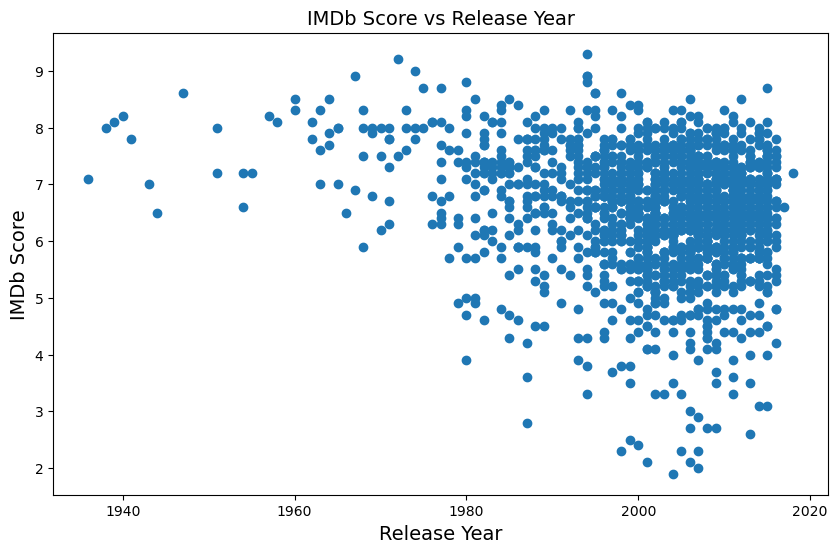

In [ ]:
# Scatter plot for imdb_score against release_year
plt.figure(figsize=(10, 6))
plt.scatter(numerical_df['release_year'], numerical_df['imdb_score'])
plt.title('IMDb Score vs Release Year')
plt.xlabel('Release Year')
plt.ylabel('IMDb Score')
plt.show()

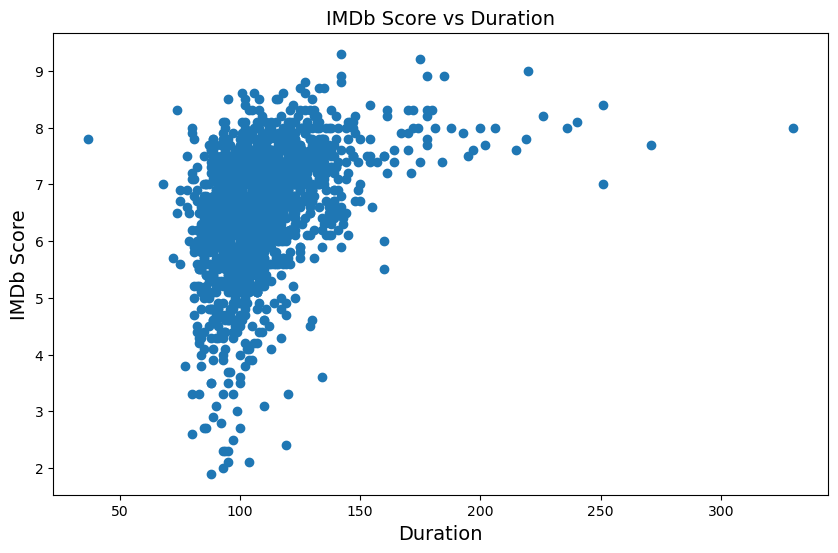

In [ ]:
# Scatter plot for imdb_score against duration
plt.figure(figsize=(10, 6))
plt.scatter(numerical_df['duration'], numerical_df['imdb_score'])
plt.title('IMDb Score vs Duration')
plt.xlabel('Duration')
plt.ylabel('IMDb Score')
plt.show()

Looking for Correlations

In [ ]:
corr_matrix = movie.corr(numeric_only=True)

In [ ]:
corr_matrix['imdb_score'].sort_values(ascending=False)

imdb_score             1.000000
duration               0.409202
drama                  0.334051
nb_news_articles       0.226816
war                    0.108275
crime                  0.062604
sport                  0.052713
western                0.052521
actor1_star_meter      0.042641
actor2_star_meter      0.037945
animation              0.020860
release_day            0.019191
actor3_star_meter     -0.007018
aspect_ratio          -0.015450
romance               -0.016458
musical               -0.025225
nb_faces              -0.069041
movie_id              -0.082305
movie_budget          -0.083850
thriller              -0.084007
movie_meter_IMDBpro   -0.086835
adventure             -0.089870
scifi                 -0.102890
action                -0.158687
horror                -0.163253
release_year          -0.184522
Name: imdb_score, dtype: float64

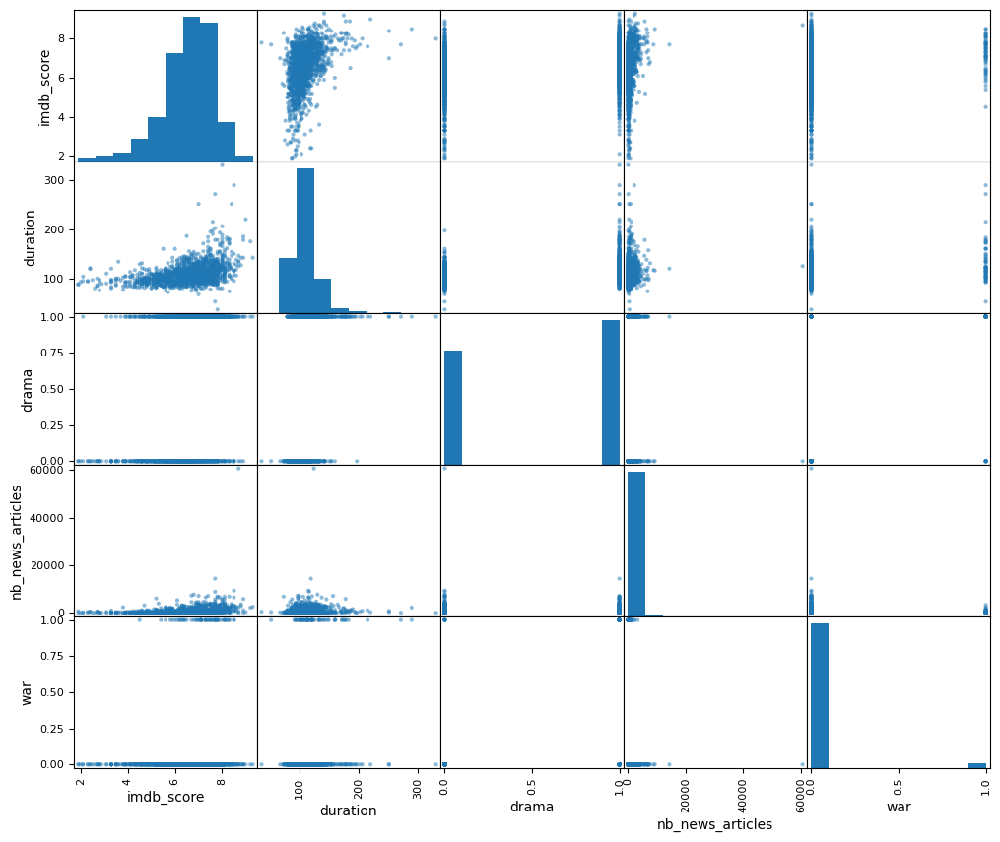

In [ ]:
from pandas.plotting import scatter_matrix

attributes = ["imdb_score", "duration", "drama", "nb_news_articles", "war"]

scatter_matrix(movie[attributes], figsize=(12, 10))

plt.show()

Data Profiling

In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(movie, title="Pandas Profiling Report")
profile.to_notebook_iframe()
profile.to_file("IMDB_rating.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

c:\Users\csg20\anaconda3\Lib\site-packages\ydata_profiling\profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

- Only 'language' contains null values, and is near 0.1%
- The numeric variables actor1_star_meter and actor2_star_meter are highly skewed
- Categorical variables - language, country, colour_film are highly imbalanced

# Data Preparation

In [ ]:
train_set.columns

Index(['movie_title', 'movie_id', 'imdb_link', 'imdb_score', 'movie_budget',
       'release_day', 'release_month', 'release_year', 'duration', 'language',
       'country', 'maturity_rating', 'aspect_ratio', 'distributor',
       'nb_news_articles', 'director', 'actor1', 'actor1_star_meter', 'actor2',
       'actor2_star_meter', 'actor3', 'actor3_star_meter', 'colour_film',
       'genres', 'nb_faces', 'plot_keywords', 'action', 'adventure', 'scifi',
       'thriller', 'musical', 'romance', 'western', 'sport', 'horror', 'drama',
       'war', 'animation', 'crime', 'movie_meter_IMDBpro', 'cinematographer',
       'production_company'],
      dtype='object')

In [ ]:
movie = train_set.drop(["movie_id","imdb_score"], axis=1)
test_set = test_set.drop(["movie_id"], axis=1)

movie_score = train_set["imdb_score"].copy()

Data Cleaning

In [ ]:
# Since only the language column contains null value, I will fill them with other
movie['language'].fillna('other', inplace=True)

test_set['language'].fillna('other', inplace=True)

C:\Users\csg20\AppData\Local\Temp\ipykernel_23736\1736296589.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  movie['language'].fillna('other', inplace=True)
C:\Users\csg20\AppData\Local\Temp\ipykernel_23736\1736296589.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exam

Check Outliers

In [ ]:
from sklearn.ensemble import IsolationForest

X = movie.select_dtypes(include=['int64', 'float64'])

isolation_forest = IsolationForest(random_state=42)
outlier_pred = isolation_forest.fit_predict(X)

In [ ]:
outlier_pred

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
movie = movie.iloc[outlier_pred == 1]
movie_score = movie_score.iloc[outlier_pred == 1]

Handling Text and Categorical Attributes

In [ ]:
columns_to_encode = ['maturity_rating', 'release_month']

for col in columns_to_encode:
    dummies = pd.get_dummies(movie[col], prefix=col, drop_first=True)
    movie = movie.drop(col, axis=1)
    movie = pd.concat([movie, dummies], axis=1)

In [ ]:
for col in columns_to_encode:
    dummies = pd.get_dummies(test_set[col], prefix=col, drop_first=True)
    test_set = test_set.drop(col, axis=1)
    test_set = pd.concat([test_set, dummies], axis=1)

Feature Engineering

In [ ]:
# extract the number of words in each movie title
def count_words(title):
    if pd.notna(title):
        return len(title.split())
    else:
        return 0

movie['movie_title_lens'] = movie['movie_title'].apply(count_words)
test_set['movie_title_lens'] = test_set['movie_title'].apply(count_words)

In [ ]:
# 'Budget-Year Ratio' Feature
movie['budget_year_ratio'] = movie['movie_budget'] / movie['release_year']
test_set['budget_year_ratio'] = test_set['movie_budget'] / test_set['release_year']

# 'budget_duration_interaction' Feature
movie['budget_duration_interaction'] = movie['movie_budget'] * movie['duration']
test_set['budget_duration_interaction'] = test_set['movie_budget'] * test_set['duration']

# 'release_decade' Feature
movie['release_decade'] = (movie['release_year'] // 10) * 10
test_set['release_decade'] = (test_set['release_year'] // 10) * 10

Feature Selection

In [ ]:
# drop 'language', 'country' and 'colour_film' since they are higly imbalanced
# drop 'aspect_ratio' since it is irreverent and genres since it has been dummified
# drop the rest since they contain too many unique values
columns_to_drop = ['movie_title', 'imdb_link', 'language', 'country', 'aspect_ratio', 'distributor', 'director',
                   'actor1', 'actor2', 'actor3', 'genres', 'plot_keywords', 'cinematographer', 'production_company',
                   'colour_film']

movie.drop(columns=columns_to_drop, inplace=True)
test_set.drop(columns=columns_to_drop, inplace=True)

In [ ]:
# remove collinearity
corr_matrix = movie.corr()

threshold = 0.8
highly_corr_pairs = {}

for col in corr_matrix:
    highly_corr_features = corr_matrix.index[corr_matrix[col] > threshold].tolist()
    highly_corr_features.remove(col)  # Remove self-correlation
    if highly_corr_features:
        highly_corr_pairs[col] = highly_corr_features

Feature Sacling

In [ ]:
from sklearn.preprocessing import StandardScaler

selected_columns = [
    'movie_budget',
    'release_day',
    'release_year',
    'duration',
    'nb_news_articles',
    'actor1_star_meter',
    'actor2_star_meter',
    'actor3_star_meter',
    'nb_faces',
    'movie_meter_IMDBpro',
    'movie_title_lens'
]

scaler = StandardScaler()
movie[selected_columns] = scaler.fit_transform(movie[selected_columns])
test_set[selected_columns] = scaler.fit_transform(test_set[selected_columns])

# Modelling

I choose to implement linear regression, Random Forest, and gredient boosting

In [ ]:
from sklearn.linear_model import LinearRegression

# Training the Linear Regression model
lin_reg = LinearRegression()
lin_reg.fit(movie, movie_score)

# Predicting the Test set results
movie_predictions = lin_reg.predict(movie)

In [ ]:
from sklearn.metrics import mean_squared_error

lin_rmse = mean_squared_error(movie_score, movie_predictions,
                              squared=False)
lin_rmse

0.8508542208798561

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Training the Random Forest model
rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
rf_reg.fit(movie, movie_score)

# Predicting the Test set results
movie_predictions = rf_reg.predict(movie)

In [ ]:
rf_mse = mean_squared_error(movie_score, movie_predictions,
                              squared=False)

rf_mse

0.30540142075157645

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Training the Gradient Boosting model
gb_reg = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gb_reg.fit(movie, movie_score)

# Predicting the Test set results
movie_predictions = gb_reg.predict(movie)

In [ ]:
svm_rmse = mean_squared_error(movie_score, movie_predictions,
                              squared=False)
svm_rmse

0.6205011493166747

Using Cross-Validation

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
lin_rmses = -cross_val_score(lin_reg, movie, movie_score,
                              scoring="neg_root_mean_squared_error", cv=10)

pd.Series(lin_rmses).describe()

count    10.000000
mean      0.888328
std       0.111775
min       0.757981
25%       0.811596
50%       0.860213
75%       0.918862
max       1.106177
dtype: float64

In [ ]:
rf_rmses = -cross_val_score(rf_reg, movie, movie_score,
                              scoring="neg_root_mean_squared_error", cv=10)


In [ ]:
pd.Series(rf_rmses).describe()

count    10.000000
mean      0.819032
std       0.131510
min       0.652484
25%       0.711360
50%       0.825564
75%       0.872340
max       1.057629
dtype: float64

In [ ]:
gb_rmses = -cross_val_score(gb_reg, movie, movie_score,
                              scoring="neg_root_mean_squared_error", cv=10)

pd.Series(gb_rmses).describe()

count    10.000000
mean      0.791882
std       0.060013
min       0.723732
25%       0.746641
50%       0.780665
75%       0.828925
max       0.912241
dtype: float64

Model Fine-Tuning

In [ ]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

#Random Forest
param_distribs_rf = {
    'n_estimators': randint(low=100, high=500),
    'max_features': randint(low=2, high=20),
    'max_depth': randint(low=3, high=30)
}

rf_reg = RandomForestRegressor(random_state=42)

rnd_search_rf = RandomizedSearchCV(
    rf_reg, param_distributions=param_distribs_rf, n_iter=10, cv=3,
    scoring='neg_root_mean_squared_error', random_state=42)

rnd_search_rf.fit(movie, movie_score)

RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(random_state=42),
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002BF09F88D10>,
                                        'max_features': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002BF09F8B550>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002BF09F8B610>},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [ ]:
final_model_rf = rnd_search_rf.best_estimator_  # includes preprocessing
feature_importances = final_model_rf.feature_importances_
feature_importances.round(2)
feature_names = movie.columns

feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
feature_importances_sorted = feature_importances.sort_values(by='importance', ascending=False)
feature_importances_sorted

,feature,importance
22,movie_meter_IMDBpro,0.165534
3,duration,0.140222
4,nb_news_articles,0.096326
18,drama,0.066748
2,release_year,0.051325
43,budget_year_ratio,0.045039
5,actor1_star_meter,0.044102
44,budget_duration_interaction,0.043734
7,actor3_star_meter,0.042536
6,actor2_star_meter,0.038566


In [ ]:
# Gradient Boosting Regressor
param_distribs_gb = {
    'n_estimators': randint(low=100, high=500),
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': randint(low=3, high=30)
}

gb_reg = GradientBoostingRegressor(random_state=42)

rnd_search_gb = RandomizedSearchCV(
    gb_reg, param_distributions=param_distribs_gb, n_iter=10, cv=3,
    scoring='neg_root_mean_squared_error', random_state=42)

rnd_search_gb.fit(movie, movie_score)

RandomizedSearchCV(cv=3, estimator=GradientBoostingRegressor(random_state=42),
                   param_distributions={'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002BF0C354FD0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002BF0C39BFD0>},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [ ]:
final_model_gb = rnd_search_gb.best_estimator_  # includes preprocessing
feature_importances = final_model_gb.feature_importances_
feature_importances.round(2)
feature_names = movie.columns

feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
feature_importances_sorted = feature_importances.sort_values(by='importance', ascending=False)
feature_importances_sorted

,feature,importance
22,movie_meter_IMDBpro,0.217974
3,duration,0.145972
18,drama,0.093908
4,nb_news_articles,0.081528
2,release_year,0.058950
43,budget_year_ratio,0.045407
5,actor1_star_meter,0.041480
7,actor3_star_meter,0.038824
44,budget_duration_interaction,0.033553
6,actor2_star_meter,0.031412


Evluate on the Test Set

In [ ]:
X_test = test_set.drop("imdb_score", axis=1)
y_test = test_set["imdb_score"].copy()

final_predictions = lin_reg.predict(X_test)

final_rmse = mean_squared_error(y_test, final_predictions, squared=False)
print(final_rmse)

1.304330240675287


In [ ]:
final_predictions = final_model_rf.predict(X_test)

final_rmse_rf = mean_squared_error(y_test, final_predictions, squared=False)
print(final_rmse_rf)

0.8009224861083227


In [ ]:
final_predictions = final_model_gb.predict(X_test)

final_rmse_gb = mean_squared_error(y_test, final_predictions, squared=False)
print(final_rmse_gb)

0.8200184199610586


# Model persistence

In [ ]:
import joblib

joblib.dump(lin_reg, "IMDB_movie_Lin.pkl")
joblib.dump(rf_reg, "IMDB_movie_Rf.pkl")
joblib.dump(gb_reg, "IMDB_movie_Gb.pkl")

# Causal Inference

### The Impact of Budget on Movie Success: A Causal Analysis Using IMDb Scores

The primary objective of this project is to investigate the causal relationship between a movie's budget and its success, as measured by IMDb scores. Despite the common assumption that higher budgets lead to better movies and thus higher ratings, this relationship is not straightforward and can be influenced by various confounding factors such as the movie's genre, release year, and duration, among others. 

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from causalml.inference.meta import BaseXRegressor, BaseRRegressor, BaseSRegressor, BaseTRegressor
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import seaborn as sns
from lightgbm import LGBMRegressor

In [ ]:
df = pd.read_csv("IMDB_rating.csv")

In [ ]:
df.columns

Index(['movie_title', 'movie_id', 'imdb_link', 'imdb_score', 'movie_budget',
       'release_day', 'release_month', 'release_year', 'duration', 'language',
       'country', 'maturity_rating', 'aspect_ratio', 'distributor',
       'nb_news_articles', 'director', 'actor1', 'actor1_star_meter', 'actor2',
       'actor2_star_meter', 'actor3', 'actor3_star_meter', 'colour_film',
       'genres', 'nb_faces', 'plot_keywords', 'action', 'adventure', 'scifi',
       'thriller', 'musical', 'romance', 'western', 'sport', 'horror', 'drama',
       'war', 'animation', 'crime', 'movie_meter_IMDBpro', 'cinematographer',
       'production_company'],
      dtype='object')

# Treatment : Budget Difference between Movies (Target: imdb score)

In [ ]:
#Target
df2 = df.copy()

df2['imdb_score'] = pd.to_numeric(df['imdb_score'], errors='coerce')

df2['imdb_score'] = df['imdb_score'].apply(lambda x: 'high score' if x > 7.4 else 'low score')

print(pd.DataFrame(df2['imdb_score'].value_counts(normalize = True)))

df2['imdb_score'] = np.where(df2['imdb_score'] == "high score", 1, 0)

            imdb_score
low score     0.810881
high score    0.189119


In [ ]:
#Treatment
budget_threshold = df2['movie_budget'].quantile(0.75)

treatment = pd.Series(np.where(df2["movie_budget"] >= budget_threshold,
                                "high budget", "low budget"), name = "movie_budget")

print(pd.DataFrame(treatment.value_counts(normalize = True)))


             movie_budget
low budget       0.696373
high budget      0.303627


In [ ]:
# Example cutoff years for different eras
cutoff_years = {
    'Silent Era': 1927,
    'Golden Age': 1960,
    'New Hollywood': 1980,
    'Home Video': 1995,
    'Digital Revolution': 2005
}

# Function to categorize each year
def categorize_year(year):
    if year < cutoff_years['Silent Era']:
        return 'Silent Era'
    elif year < cutoff_years['Golden Age']:
        return 'Golden Age'
    elif year < cutoff_years['New Hollywood']:
        return 'New Hollywood'
    elif year < cutoff_years['Home Video']:
        return 'Home Video'
    elif year < cutoff_years['Digital Revolution']:
        return 'Digital Revolution'
    else:
        return 'Streaming Era'

df2['era'] = df['release_year'].apply(categorize_year)

X = df2[['duration', 'maturity_rating', 'action', 'adventure', 'scifi',
         'thriller', 'musical', 'romance', 'western', 'sport', 'horror',
         'drama', 'war', 'animation', 'crime', 'nb_news_articles',
         'actor1_star_meter', 'actor2_star_meter', 'actor3_star_meter', 'era']]

X = pd.get_dummies(X, columns=['maturity_rating','era'], drop_first=False)

X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1930 entries, 0 to 1929
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   duration                  1930 non-null   int64
 1   action                    1930 non-null   int64
 2   adventure                 1930 non-null   int64
 3   scifi                     1930 non-null   int64
 4   thriller                  1930 non-null   int64
 5   musical                   1930 non-null   int64
 6   romance                   1930 non-null   int64
 7   western                   1930 non-null   int64
 8   sport                     1930 non-null   int64
 9   horror                    1930 non-null   int64
 10  drama                     1930 non-null   int64
 11  war                       1930 non-null   int64
 12  animation                 1930 non-null   int64
 13  crime                     1930 non-null   int64
 14  nb_news_articles          1930 non-null 

In [ ]:
#standarize the numericals
standard_scaler = StandardScaler()

numeric_cols = ['duration', 'nb_news_articles', 'actor1_star_meter', 'actor2_star_meter', 'actor3_star_meter']

X[numeric_cols] = standard_scaler.fit_transform(X[numeric_cols])

y = df2['imdb_score']

# Implement s Learner

In [ ]:
X_train, X_test, Y_train, Y_test, T_train, T_test = train_test_split(X, y, treatment, test_size=0.2, random_state=42)

In [ ]:
feature_names = list(X.columns)

### S_learner wirh LGBMRegressor

In [ ]:
slearner = BaseSRegressor(LGBMRegressor(random_state=42), control_name='low budget')
slearner_ate_lgb = slearner.estimate_ate(X=X_train, treatment=T_train, y=Y_train)[0]
slearner_ate_lgb

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 1544, number of used features: 26
[LightGBM] [Info] Start training from score 0.189119


-0.07484183173384468

In [ ]:
slearner_tau = slearner.fit_predict(X=X_train, treatment=T_train, y=Y_train)

slearn_importance_lgb = slearner.get_importance(X=X_train,
                        tau=slearner_tau,
                        normalize=True,
                        method='auto',
                        features=feature_names)
slearn_importance_lgb

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1149
[LightGBM] [Info] Number of data points in the train set: 1544, number of used features: 26
[LightGBM] [Info] Start training from score 0.189119
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requiremen

{'high budget': duration                    0.300710
 nb_news_articles            0.170133
 actor2_star_meter           0.137483
 actor1_star_meter           0.103138
 actor3_star_meter           0.082637
 era_Streaming Era           0.049849
 action                      0.032808
 thriller                    0.027109
 drama                       0.021436
 adventure                   0.017851
 romance                     0.017377
 era_Digital Revolution      0.017286
 maturity_rating_R           0.004774
 horror                      0.004239
 era_Home Video              0.003886
 era_New Hollywood           0.002799
 sport                       0.001802
 crime                       0.001604
 maturity_rating_PG          0.001032
 maturity_rating_PG-13       0.000869
 scifi                       0.000421
 war                         0.000344
 musical                     0.000343
 maturity_rating_G           0.000069
 maturity_rating_NC-17       0.000000
 maturity_rating_M           0.0000

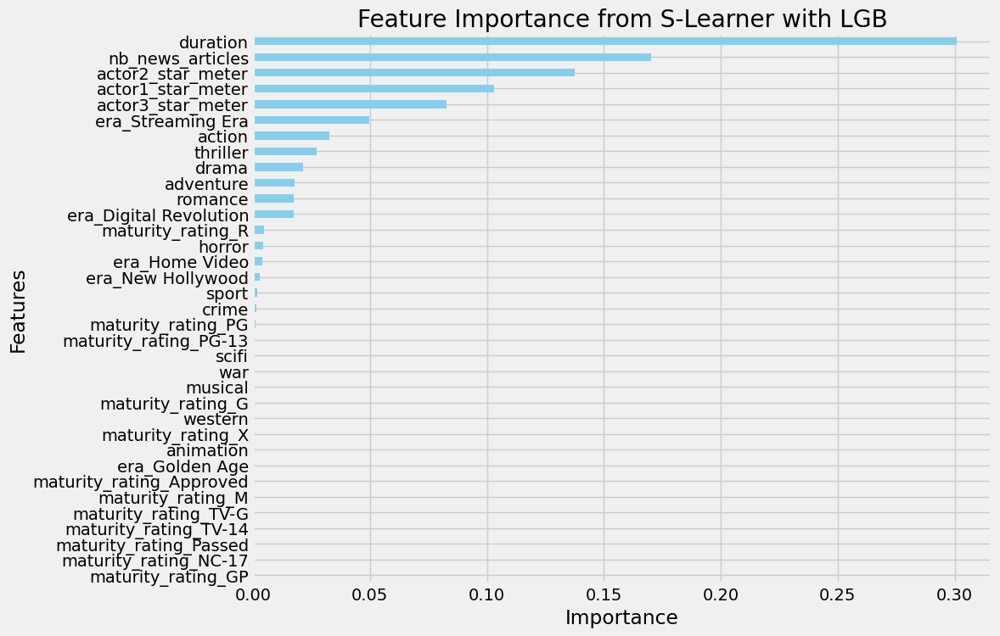

In [ ]:
# Extract feature importances and sort them
importances = pd.Series(slearn_importance_lgb['high budget']).sort_values()

# Plotting
plt.figure(figsize=(10, 8))
importances.plot(kind='barh', color='skyblue')
plt.title('Feature Importance from S-Learner with LGB')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

In [ ]:
shap_slearner_lgb = slearner.get_shap_values(X=X_train, tau=slearner_tau)
shap_slearner_lgb

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split

{'high budget': array([[ 3.98991620e-02, -5.58242841e-03, -3.07384666e-03, ...,
         -2.44110540e-04,  1.19820385e-03, -8.18894332e-03],
        [ 3.00752090e-02,  2.66847445e-02, -3.18710191e-03, ...,
          1.94855512e-03,  6.56361060e-04, -9.42790688e-03],
        [-1.54284284e-01, -8.82733988e-03, -4.57404753e-03, ...,
         -8.87192378e-05,  1.11446416e-03,  4.77353475e-03],
        ...,
        [ 1.43110248e-02, -2.50584825e-03, -1.43628802e-03, ...,
         -2.27915473e-04,  8.31600070e-04, -3.62966803e-02],
        [ 4.26681433e-02, -3.68961122e-03, -4.27735707e-03, ...,
         -1.20423819e-04,  9.54658915e-04, -7.99006340e-03],
        [-5.22665911e-02, -1.41330970e-02, -4.66504015e-03, ...,
         -2.62046483e-04,  9.91373875e-04,  1.82009351e-02]])}

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split

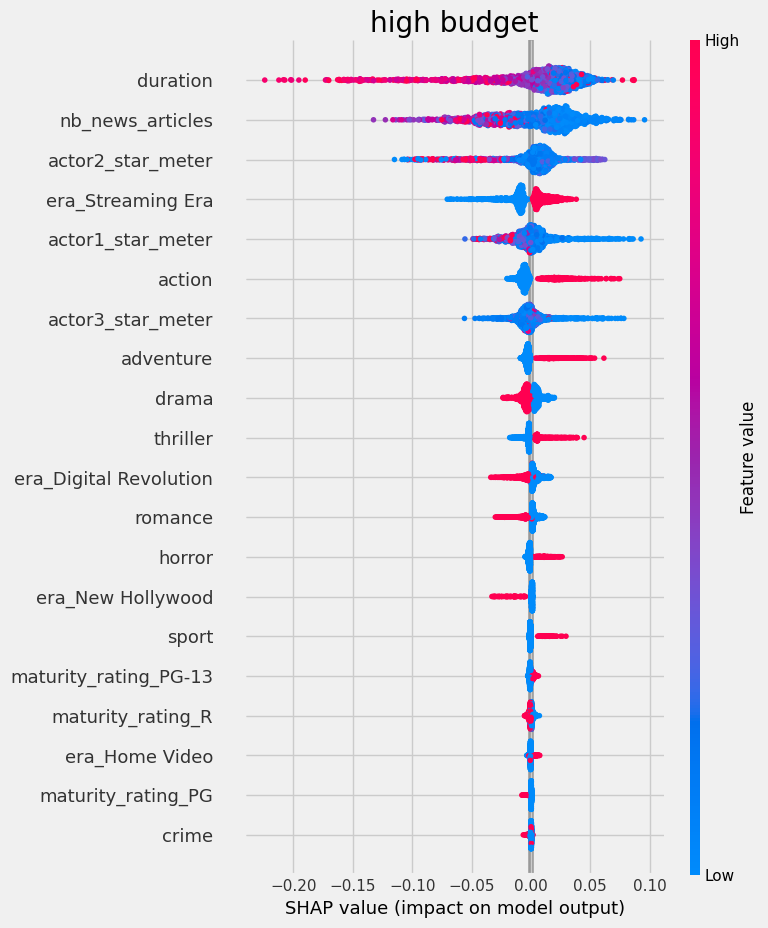

In [ ]:
slearner.plot_shap_values(X=X_train, tau=slearner_tau, features=feature_names)

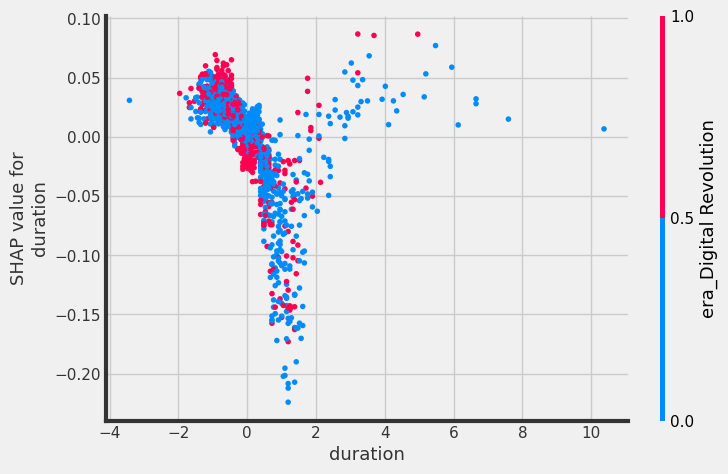

In [ ]:
slearner.plot_shap_dependence(treatment_group='high budget',
                              feature_idx='duration',
                              X=X_train,
                              tau=slearner_tau,
                              interaction_idx='auto',
                              shap_dict=shap_slearner_lgb,
                              features=feature_names)

### S_learner wirh XGBRegressor()

In [ ]:
slearner = BaseSRegressor(XGBRegressor(random_state=42), control_name='low budget')
slearner_ate_xgb = slearner.estimate_ate(X=X_train, treatment=T_train, y=Y_train)[0]
slearner_ate_xgb

-0.050369384819301664

In [ ]:
slearner_tau = slearner.fit_predict(X=X_train, treatment=T_train, y=Y_train)

slearn_importance_xgb = slearner.get_importance(X=X_train,
                                            tau=slearner_tau,
                                            normalize=True,
                                            method='auto',
                                            features=feature_names)
slearn_importance_xgb

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split

{'high budget': duration                    0.216320
 actor2_star_meter           0.190815
 nb_news_articles            0.178638
 actor3_star_meter           0.149369
 actor1_star_meter           0.116313
 era_Streaming Era           0.030200
 drama                       0.027606
 era_Home Video              0.021482
 era_Digital Revolution      0.013300
 action                      0.008484
 adventure                   0.008427
 romance                     0.006946
 thriller                    0.006852
 maturity_rating_PG-13       0.005687
 maturity_rating_R           0.004918
 horror                      0.004222
 war                         0.004045
 sport                       0.002489
 scifi                       0.001528
 crime                       0.001488
 maturity_rating_PG          0.000413
 era_New Hollywood           0.000198
 maturity_rating_G           0.000136
 musical                     0.000107
 western                     0.000017
 maturity_rating_GP          0.0000

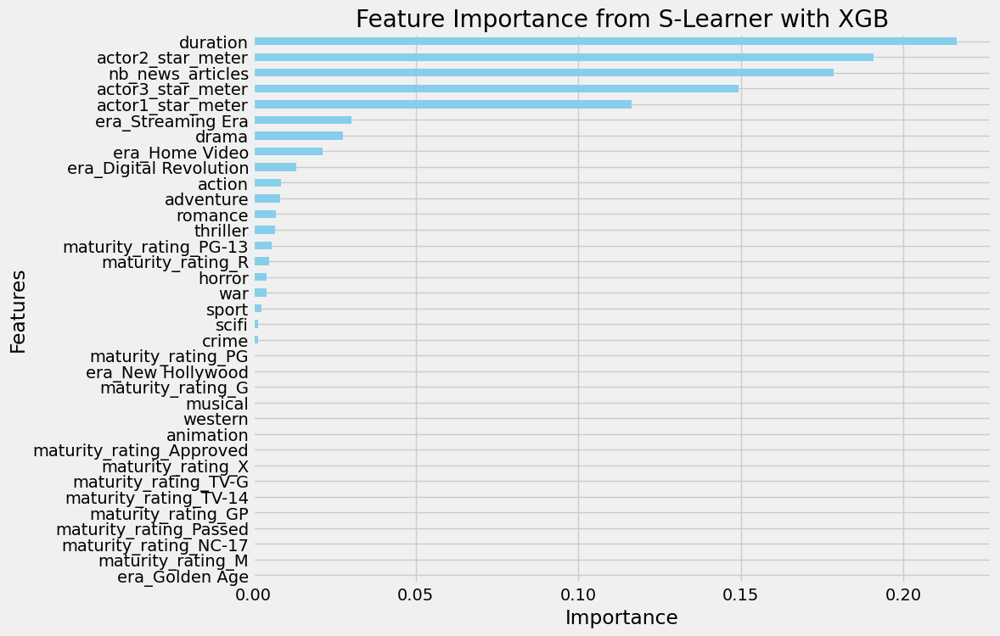

In [ ]:
# Extract feature importances and sort them
importances = pd.Series(slearn_importance_xgb['high budget']).sort_values()

# Plotting
plt.figure(figsize=(10, 8))
importances.plot(kind='barh', color='skyblue')
plt.title('Feature Importance from S-Learner with XGB')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

In [ ]:
shap_slearner_xgb = slearner.get_shap_values(X=X_train, tau=slearner_tau)
shap_slearner_xgb

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split

{'high budget': array([[ 1.70712422e-02, -3.22852862e-03, -5.59691134e-04, ...,
         -2.75110653e-03, -6.61750475e-05, -2.49005243e-03],
        [-8.80699635e-04,  1.34314181e-02, -1.67482176e-04, ...,
          3.96209395e-03,  1.44955553e-04,  8.48418292e-04],
        [-1.00423441e-01, -5.05079133e-03, -4.22845098e-03, ...,
         -9.22391248e-04, -4.60262483e-05, -9.61229439e-03],
        ...,
        [ 6.99764696e-04,  1.96804120e-03, -1.45736135e-03, ...,
         -9.42356699e-04, -5.74605107e-05, -1.39744177e-02],
        [ 1.62688619e-02, -3.15729204e-03, -3.31901385e-03, ...,
          4.68863313e-03, -4.48254563e-05, -1.65516008e-03],
        [-3.48006543e-03, -6.34466274e-03, -1.56838339e-03, ...,
         -5.12091950e-04, -2.46536105e-05,  5.04153816e-03]])}

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split

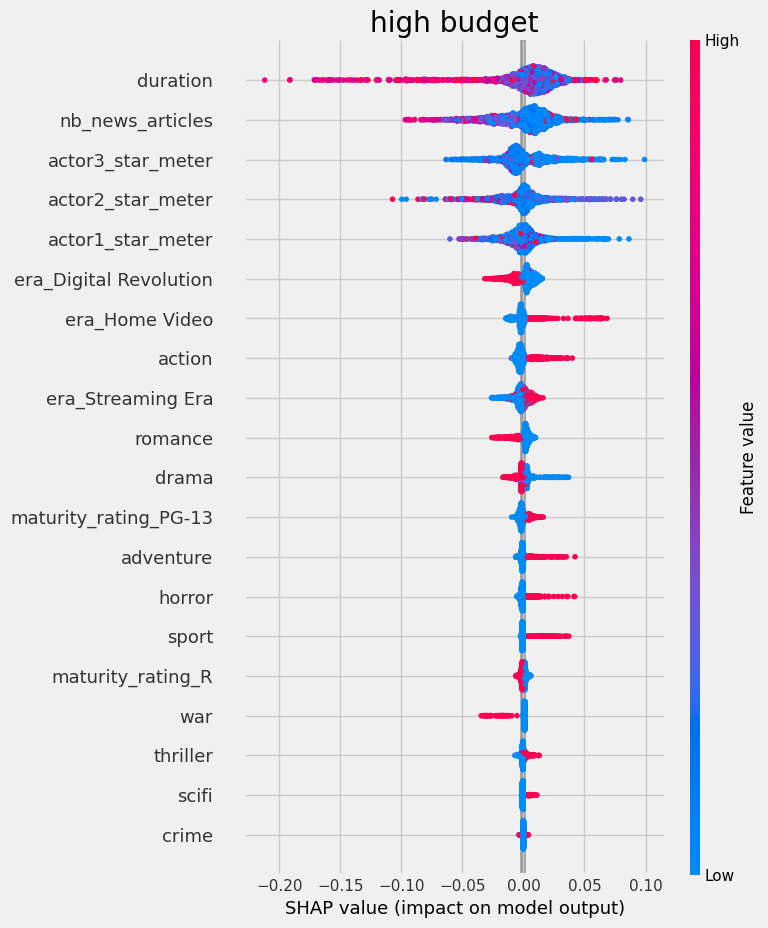

In [ ]:
slearner.plot_shap_values(X=X_train, tau=slearner_tau, features=feature_names)

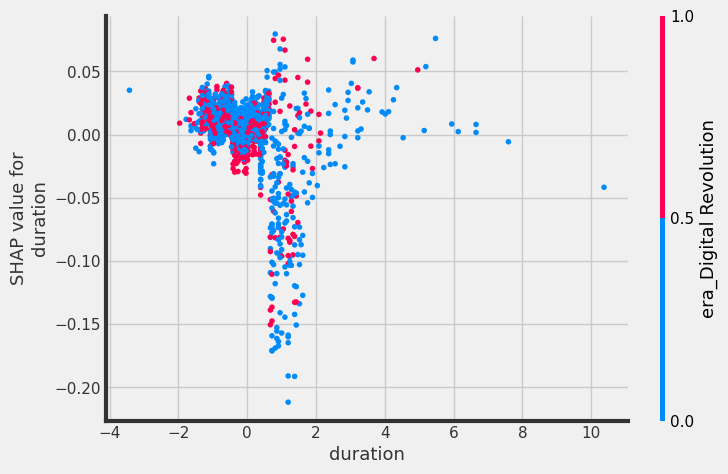

In [ ]:
slearner.plot_shap_dependence(treatment_group='high budget',
                              feature_idx='duration',
                              X=X_train,
                              tau=slearner_tau,
                              interaction_idx='auto',
                              shap_dict=shap_slearner_xgb,
                              features=feature_names)

In [ ]:
slearner_ate_lgb, slearner_ate_xgb

(-0.07484183173384468, -0.050369384819301664)